data['trial_index']: trial index
data['trial_time']: time at which trial starts with th e central fixation dot
data['response_arrow_start_angle']: the angle of the response arrow at the start of the response phase.
data['motion_direction']: the stimulus motion direction
data['motion_coherence']: the stimulus motion coherence
data['estimate_x']: x cartesian coordinate of the stimulus motion direction
data['estimate_y']: y cartesian coordinate of the stimulus motion direction
data['reaction_time']: subject's reaction time
data['raw_response_time']: subject response time since the start of the run (of about 200 trials)
data['prior_std']: It is the standard deviation of the statistical distribution (motion direction generative process over trials, which we call "experimental prior") from which we sampled the stimulus motion direction displayed in each trial.
data['prior_mean']: the most frequently displayed motion direction. It is the mean of the statistical distribution (motion direction generative process over trials, which we call "experimental prior") from which we sampled the stimulus motion direction displayed in each trial.
data['subject_id']: the id of the subject for which behavior was recorded.
data['experiment_name']: the name of the experiment. This dataaset only contains the "data01_direction4priors" experiment in which subject underwent a task in which four motion direction were sampled from one of four priors with 10, 40, 60 and 80 degree standard deviations in each block of about 200 trials. The mean of the "experimental prior" was fixed at 225 deg.
data['experiment_id']: the id of the experiment.
data['session_id']: the id of the session.
data['run_id']: the id of the run.

In [ ]:
# Imports
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os, requests
from matplotlib import colors
from matplotlib import rcParams
from matplotlib.colors import ListedColormap
from numpy import pi
from copy import copy
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
import seaborn as sns
import warnings

In [ ]:
#Data retrieval
url = "https://github.com/steevelaquitaine/projInference/raw/gh-pages/data/csv/data01_direction4priors.csv"
try:
  RequestAPI = requests.get(url)
except requests.ConnectionError:
  print("Failed to download data. Please contact steeve.laquitaine@epfl.ch")
else:
  if RequestAPI.status_code != requests.codes.ok:
    print("Failed to download data. Please contact steeve.laquitaine@epfl.ch")
  else:
    with open("data01_direction4priors.csv", "wb") as fid:
      fid.write(RequestAPI.content)

In [ ]:
#Data loading

subject_id=[subject for subject in range(1,13)]
session_id=[session for session in range(1,7)]
run_id=[run for run in range(1,30)]

#!!!!!!Setting a smaller dataset for test, change the number for more plots!!!!!!
#subject_id=[subject for subject in range(1,2)]
#session_id=[session for session in range(1,2)]
#run_id=[run for run in range(1,3)]

df = pd.read_csv("data01_direction4priors.csv")
df
#df = df[df["subject_id"] == 1]
#df = df[df["session_id"] == 1]
#df = df[df["run_id"] == 1]

,trial_index,trial_time,response_arrow_start_angle,motion_direction,motion_coherence,estimate_x,estimate_y,reaction_time,raw_response_time,prior_std,prior_mean,subject_id,experiment_name,experiment_id,session_id,run_id
0,1,0.000000,NaN,225,0.12,-1.749685,-1.785666,NaN,NaN,10,225,1,data01_direction4priors,11,1,1
1,2,2.730730,NaN,225,0.12,-1.819693,-1.714269,NaN,NaN,10,225,1,data01_direction4priors,11,1,1
2,3,4.913950,NaN,235,0.06,-1.562674,-1.951422,NaN,NaN,10,225,1,data01_direction4priors,11,1,1
3,4,6.997296,NaN,225,0.06,-1.601388,-1.919781,NaN,NaN,10,225,1,data01_direction4priors,11,1,1
4,5,9.097130,NaN,215,0.24,-1.639461,-1.887371,NaN,NaN,10,225,1,data01_direction4priors,11,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83208,198,571.895796,47.0,205,0.06,-0.895369,-2.334162,1.298565,574.493754,40,225,12,data01_direction4priors,12,6,30
83209,199,574.708207,238.0,265,0.12,-1.915175,-1.606893,1.175129,577.181812,40,225,12,data01_direction4priors,12,6,30
83210,200,577.408906,300.0,245,0.06,-0.076489,-2.498830,0.793728,579.492137,40,225,12,data01_direction4priors,12,6,30
83211,201,579.720922,10.0,185,0.12,0.177676,-2.493678,1.363531,582.373810,40,225,12,data01_direction4priors,12,6,30


In [ ]:
#Q1.Calculate subject estimate (estimate error) at each trial
def calc_subject_estimate_deg(df):
    subject_estimate_rad = np.arctan2(df["estimate_y"], df["estimate_x"])
    subject_estimate_deg= np.degrees(subject_estimate_rad)
    return subject_estimate_deg

def calc_estimate_error(df, subject_estimate_deg):
    estimate_error_deg = df["motion_direction"]-subject_estimate_deg
    estimate_error_deg = (estimate_error_deg + 180) % 360 - 180
    return estimate_error_deg

In [ ]:
#Q1.Calculate circular distance between past trial estimates and current trial displayed directions
def calc_circular_distance(df):
    circular_distances_deg = []
    for i in range(1, len(df)):
        prev_estimate_rad = np.arctan2(df["estimate_y"].iloc[i - 1], df["estimate_x"].iloc[i - 1])
        current_direction_rad = np.radians(df["motion_direction"].iloc[i])
        circular_distance_rad = np.angle(np.exp(1j * (current_direction_rad - prev_estimate_rad)))
        circular_distance_deg = np.degrees(circular_distance_rad)
        circular_distances_deg.append(circular_distance_deg)
    return  circular_distances_deg

In [ ]:
#Q2.Plot the error time course: estimate_error (degrees) ~ circular distances (degrees)
def plot_error_time_course(df, estimate_error_deg, circular_distances_deg):
    subject_id = df['subject_id'].iloc[0]
    session_id = df['session_id'].iloc[0]
    run_id = df['run_id'].iloc[0]
    prior_std=df["prior_std"].iloc[0]

    trial_index = range(1, len(df) + 1)
    plt.plot(trial_index, estimate_error_deg, marker='o', label="Estimate Error")
    plt.plot(range(2, len(df) + 1), circular_distances_deg, marker='o', label="Circular Distance")
    plt.xlabel('Trial Index')
    plt.ylabel('Error (degrees)')
    plt.title(f"Error Time Courses\nSubject: {subject_id}, Session: {session_id}, Run: {run_id}, Prior Std: {prior_std}")
    plt.legend()
    plt.grid(True)
    plt.show()

In [ ]:
#Q2.Linear regression: Mean of subject_estimate_deg for previous 5 trials~current trial motion direction
def get_linear_regression(df, subject_estimate_deg):
  x_values = []
  y_values = []

  for i in range(5, len(df)):
      x = np.mean(subject_estimate_deg[i-5:i])
      y = df.loc[i, "motion_direction"]
      x_values.append(x)
      y_values.append(y)

  if len(x_values) <= 1:
      print("Insufficient data for linear regression.")
      return

  df2 = pd.DataFrame({'X': x_values, 'y': y_values})
  df2 = df2.dropna()

  if df2.shape[0] <= 1:
      print("Insufficient data after removing missing values for linear regression.")
      return

  X = df2["X"].to_numpy().reshape((-1, 1))
  y = df2["y"]

  # Split the data into train and test sets (80% train, 20% test)
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

  model = LinearRegression().fit(X_train, y_train)

  print("Intercept:", model.intercept_)
  print("Coefficient:", model.coef_)

  # Predict error on the train set
  #y_train_pred = model.predict(X_train)

  # Calculate R-squared (coefficient of determination) on the test set
   #X_test_pred=model.predict(X_test)
  #r_squared = r2_score(y_test, X_test_pred)
  #print("R-squared on the test set:", r_squared)

  plt.scatter(X, y)
  plt.plot(X, model.predict(X), color='red')
  plt.xlabel("Mean of previous 5 'subject_estimate_deg'")
  plt.ylabel("Current 'motion_direction'")
  plt.show()

In [ ]:
#Aggregating Data: Create a function to aggregate reaction time data over a specified number of trials or time intervals.
#Using a moving average approach to smooth the data for simplicity
#Run before plot function
def moving_average(data, window_size=5):
    return data.rolling(window=window_size, min_periods=1).mean()

In [ ]:
#Filters only rows with valid reaction time (actually already performed inside some plot functions)
def delete_nan_reaction_time(df_filtered):
    nonnans_df = df_filtered.dropna(subset=['reaction_time'])
    return nonnans_df

In [ ]:
#Plot reaction time: reaction time~trial index (what is the pattern of reaction time change over time?)
#Note: This function is not used in "Filter the trials N.1&2"
def plot_reaction_time(df):
    subject_id = df['subject_id'].iloc[0]
    session_id = df['session_id'].iloc[0]
    run_id = df['run_id'].iloc[0]
    prior_std=df["prior_std"].iloc[0]

    #Check if all values in the reaction_time column are NaN
    if df["reaction_time"].notnull().any():
        #Drop the rows with NaN reaction_time values
        df_no_nan = df.dropna(subset=["reaction_time"])
        trial_index = df_no_nan["trial_index"]
        reaction_time = df_no_nan["reaction_time"]

        #Smooth the reaction time data using moving average
        reaction_time_smoothed = moving_average(reaction_time, window_size=5)

        #plt.plot(trial_index, reaction_time_smoothed, marker='o') This line is without different colors

        #Use different color for each run
        sns.lineplot(x=trial_index, y=reaction_time_smoothed, hue=df_no_nan['run_id'], palette='tab10', marker='o')
    else:
        print(f"No reaction time data for Subject ID: {subject_id}, Session ID: {session_id}, Run ID: {run_id}")
        return

    plt.xlabel('Trial Index')
    plt.ylabel('Reaction Time')
    plt.title(f"Reaction Time~Trial Index\nSubject: {subject_id}, Session: {session_id}, Run: {run_id}, Prior Std: {prior_std}")
    plt.grid(True)
    plt.show()

In [ ]:
#Plot the linear regression for reaction time
#Note: This function is not used in "Filter the trials N.1&2"
def get_linear_regression_for_reaction_time(df):
    trial_index = df["trial_index"]
    reaction_time = df["reaction_time"]

    # Drop the rows with NaN reaction_time values
    df_no_nan = df.dropna(subset=["reaction_time"])
    trial_index = df_no_nan["trial_index"]
    reaction_time = df_no_nan["reaction_time"]

    # Check if there are any valid data points for linear regression
    if len(reaction_time) == 0:
        print("No valid data points for linear regression.")
        return None

    X = trial_index.to_numpy().reshape(-1, 1)
    y = reaction_time.to_numpy()

    model = LinearRegression().fit(X, y)

    print("Intercept:", model.intercept_)
    print("Coefficient:", model.coef_)
    print("R-squared:", model.score(X, y))

    # Plot the data points
    plt.scatter(trial_index, reaction_time, marker='o', label='Data Points')
    # Plot the linear regression line
    plt.plot(trial_index, model.predict(X), color='red', label='Linear Regression')

    plt.xlabel('Trial Index')
    plt.ylabel('Reaction Time')
    plt.title('Linear Regression of Reaction Time')
    plt.legend()
    plt.grid(True)
    plt.show()

    return model

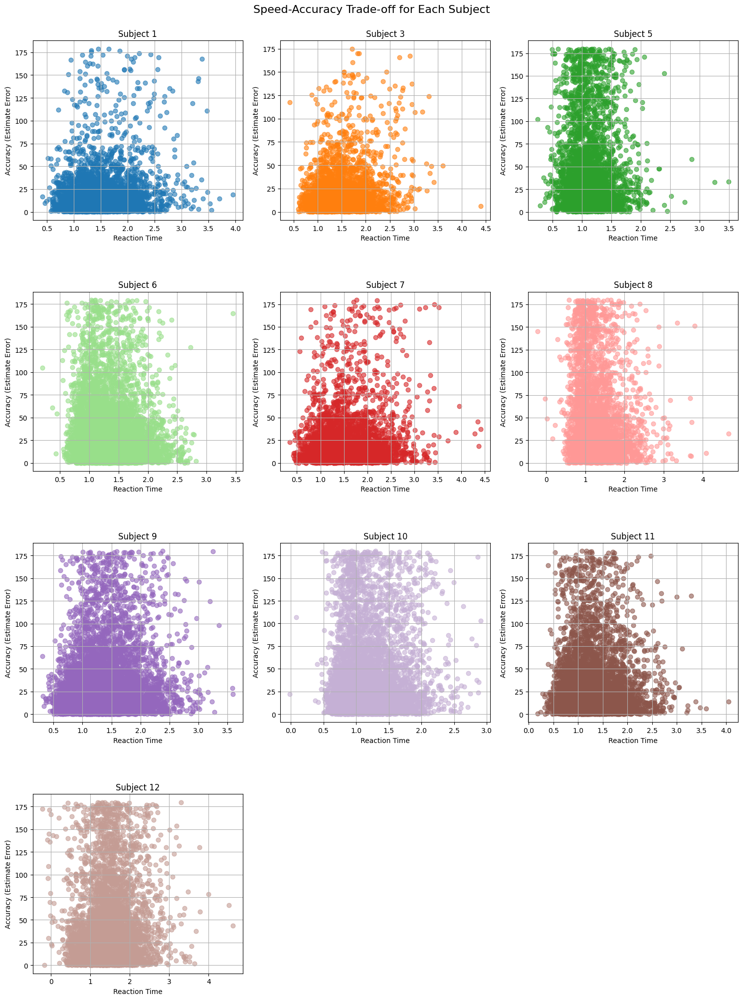

In [ ]:
#Plot speed accuracy tradeoff: accuracy (estimate error)~reaction time for each subject
def plot_speed_accuracy_tradeoff(df):
    df['subject_estimate_deg'] = calc_subject_estimate_deg(df)
    df['accuracy'] = np.abs(calc_estimate_error(df, df['subject_estimate_deg']))

    # Create separate plots for each subject in a grid layout
    unique_subjects = df['subject_id'].unique()
    num_subjects = len(unique_subjects)
    num_cols = 3  # Number of columns in the grid
    num_rows = int(np.ceil(num_subjects / num_cols))  # Number of rows in the grid

    cmap = plt.get_cmap('tab20') #Set different colors for each subject

    plt.figure(figsize=(15, 5 * num_rows))

    # Variable to keep track of the current subplot position
    current_subplot = 1

    for i, subject_id in enumerate(unique_subjects):
        subject_df = df[df['subject_id'] == subject_id]

        # Check if "reaction_time" values are not empty for the subject
        if not subject_df['reaction_time'].isnull().all():
            plt.subplot(num_rows, num_cols, current_subplot)

            jitter = np.random.normal(loc=0, scale=0.1, size=len(subject_df))
            color = cmap(i % cmap.N)  # Get a unique color for each subject

            plt.scatter(subject_df['reaction_time'] + jitter, subject_df['accuracy'], s=40, alpha=0.6, color=color)

            plt.xlabel('Reaction Time')
            plt.ylabel('Accuracy (Estimate Error)')
            plt.title(f'Subject {subject_id}')
            plt.grid(True)

            # Increment the current subplot position
            current_subplot += 1

    plt.suptitle('Speed-Accuracy Trade-off for Each Subject', fontsize=16, y=1)
    plt.tight_layout()
    plt.subplots_adjust(hspace=0.4)
    plt.show()

plot_speed_accuracy_tradeoff(df)

In [ ]:
#Calculate reaction_time averaged by each prior_std, for each subject
#Return a dataframe, use print inside function to see how attributes look like
def get_averaged_reaction_time_df(df):
    prior_std_list = [10, 20, 40, 80]
    # Ensure matrix column/row number is same for each row
    max_trial_index = df['trial_index'].max()

    # Create empty DataFrame to store averaged_reaction_time for all subjects and prior_std
    columns = ['subject_id', 'trial_index'] + prior_std_list
    averaged_reaction_time_df = pd.DataFrame(columns=columns)

    # Loop over each subject
    for subject in subject_id:
        # Loop over each prior_std (must average all the runs with the same prior_std first)
        for prior_std in prior_std_list:
            # Get all runs with the same prior_std for the current subject
            df_filtered_prior_std = df[(df["subject_id"] == subject) & (df["prior_std"] == prior_std)]

            if not df_filtered_prior_std.empty:
                # Apply the delete_nan_reaction_time function to remove rows with NaN values in "reaction_time"
                df_filtered_prior_std = delete_nan_reaction_time(df_filtered_prior_std)

                # Make a matrix (row: max_trial_index, column: number_of_runs_with_same_prior_std), preset all data and trials with NaN
                num_unique_runs = len(df_filtered_prior_std['run_id'].unique())
                prior_std_matrix = np.empty((max_trial_index, num_unique_runs))
                prior_std_matrix[:] = np.nan

                # Loop over each run with the same prior_std
                for i, run_id in enumerate(df_filtered_prior_std['run_id'].unique()):
                    # Get the reaction time data for the current run
                    reaction_time_data = df_filtered_prior_std[df_filtered_prior_std["run_id"] == run_id]["reaction_time"]

                    # Store the reaction time data in the corresponding column of the matrix, filling remaining with NaN
                    prior_std_matrix[:len(reaction_time_data), i] = reaction_time_data

                #print(f"'prior_std_matrix' for subject {subject} prior_std {prior_std} is: \n{prior_std_matrix}")

                #Ignore RuntimeWarning: Mean of empty slice, because some cells have NaN deliberately filled to ensure matrix shape
                warnings.filterwarnings("ignore", message="Mean of empty slice", category=RuntimeWarning)

                # Average each trial for all the runs (with the same prior_std) to get one average data for each trial
                averaged_reaction_time = np.nanmean(prior_std_matrix, axis=1)

                #print(f"'averaged_reaction_time' for subject {subject} prior_std {prior_std} is: \n{averaged_reaction_time}")

                # Add averaged_reaction_time to prior_std_matrix
                prior_std_df = pd.DataFrame({
                    'subject_id': [subject] * max_trial_index,  # Repeat subject_id for each trial index
                    'trial_index': range(1, max_trial_index + 1),
                    prior_std: averaged_reaction_time
                })

                #print(f"'prior_std_df' for subject {subject} prior_std {prior_std} is: \n {prior_std_df}")

                #Add prior_std_df to the DataFrame for all subjects and all prior_std, which we will use for the plot
                averaged_reaction_time_df = pd.concat([averaged_reaction_time_df, prior_std_df], ignore_index=True)

    return averaged_reaction_time_df

averaged_reaction_time_df=get_averaged_reaction_time_df(df)
print(f"'averaged_reaction_time_df' is: \n {averaged_reaction_time_df}")

'averaged_reaction_time_df' is: 
       subject_id trial_index        10  20  40        80
0              1           1  2.584972 NaN NaN       NaN
1              1           2  1.558753 NaN NaN       NaN
2              1           3  2.049542 NaN NaN       NaN
3              1           4  1.329775 NaN NaN       NaN
4              1           5  1.828999 NaN NaN       NaN
...          ...         ...       ...  ..  ..       ...
10843         12         222       NaN NaN NaN  1.434445
10844         12         223       NaN NaN NaN  1.552815
10845         12         224       NaN NaN NaN  1.098002
10846         12         225       NaN NaN NaN  1.464001
10847         12         226       NaN NaN NaN  1.577591

[10848 rows x 6 columns]


In [ ]:
#Using averaged_reaction_time_df, plot out reaction time by subjects, for each prior_std
def plot_reaction_time_by_subjects(averaged_reaction_time_df):
    # Melt the DataFrame to have 'prior_std' values as a separate column
    melted_df = pd.melt(averaged_reaction_time_df, id_vars=['subject_id', 'trial_index'], var_name='prior_std', value_name='reaction_time')
    print(melted_df)
    # Filter out rows with NaN values in 'reaction_time' column
    melted_df = melted_df.dropna(subset=['reaction_time'])

    # Plotting one graph per subject
    subjects = melted_df['subject_id'].unique()
    for subject in subjects:
        plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
        sns.lineplot(x='trial_index', y='reaction_time', hue='prior_std', data=melted_df[melted_df['subject_id'] == subject], marker='o')
        plt.title(f"Subject {subject} - Reaction Time vs. Trial Index")
        plt.xlabel("Trial Index")
        plt.ylabel("Reaction Time")
        plt.legend(title='Prior Std', title_fontsize='12', loc='best')
        plt.show()

In [ ]:
#Using averaged_reaction_time_df, plot out reaction time by prior_std, for each subject
def plot_reaction_time_by_prior_std(averaged_reaction_time_df, subject_id_list=None):
    warnings.warn("You can change subject_ids in subject_id_list to add/remove subjects shown in plots")

    #Only these subjects contain valid data to be plotted
    valid_subject_ids = [1, 3, 5, 6, 7, 8, 9, 10, 11, 12]

    # Check if subject_id_list contains only valid values
    if subject_id_list is not None:
        invalid_subject_ids = set(subject_id_list) - set(valid_subject_ids)
        if invalid_subject_ids:
            raise ValueError(f"Invalid subject IDs: {invalid_subject_ids}. Valid subject IDs are: {valid_subject_ids}")

    # Melt the DataFrame to have 'prior_std' values as a separate column
    melted_df = pd.melt(averaged_reaction_time_df, id_vars=['subject_id', 'trial_index'], var_name='prior_std', value_name='reaction_time')

    # Filter out rows with NaN values in 'reaction_time' column
    melted_df = melted_df.dropna(subset=['reaction_time'])

    # Filter data to plot only specified subjects
    melted_df = melted_df[melted_df['subject_id'].isin(subject_id_list)]

    # Define a custom color palette with distinct colors for each subject
    num_subjects = len(melted_df['subject_id'].unique())
    custom_palette = sns.color_palette('tab20', num_subjects)

    # Plotting one graph per prior_std
    prior_std_values = melted_df['prior_std'].unique()
    for prior_std in prior_std_values:
        plt.figure(figsize=(14, 8))  # Adjust the figure size as needed

        # Filter the melted DataFrame for the specific 'prior_std'
        plot_data = melted_df[melted_df['prior_std'] == prior_std]

        # Use sns.lineplot with 'hue' set to 'subject_id' for different colors
        sns.lineplot(x='trial_index', y='reaction_time', hue='subject_id', data=plot_data, marker='o', palette=custom_palette, err_style=None)

        plt.title(f"Prior Std {prior_std} - Reaction Time vs. Trial Index - ")
        plt.xlabel("Trial Index")
        plt.ylabel("Reaction Time")
        plt.legend(title='Subject ID', title_fontsize='12', loc='best')
        plt.show()

      subject_id trial_index prior_std  reaction_time
0              1           1        10       2.584972
1              1           2        10       1.558753
2              1           3        10       2.049542
3              1           4        10       1.329775
4              1           5        10       1.828999
...          ...         ...       ...            ...
43387         12         222        80       1.434445
43388         12         223        80       1.552815
43389         12         224        80       1.098002
43390         12         225        80       1.464001
43391         12         226        80       1.577591

[43392 rows x 4 columns]


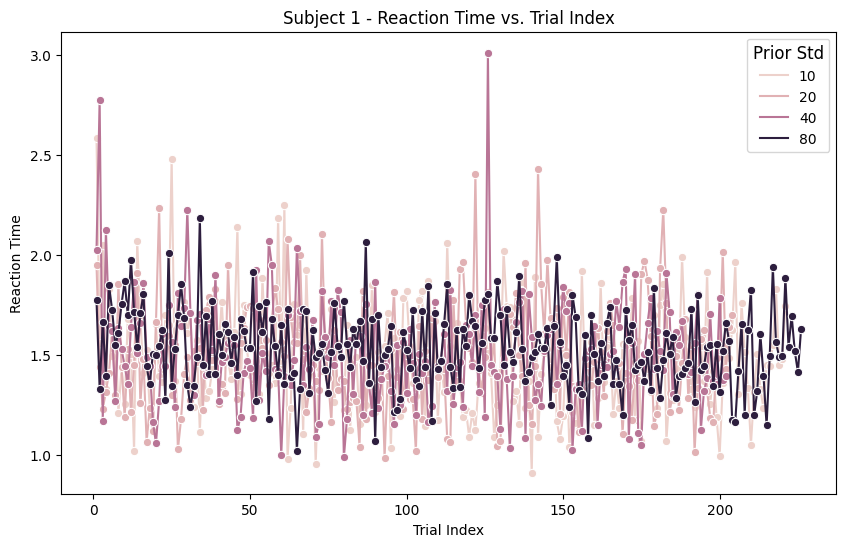

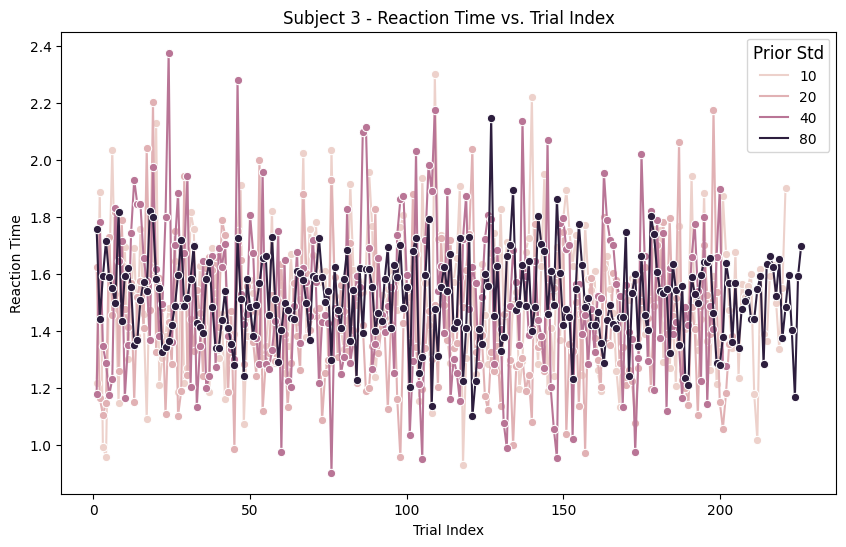

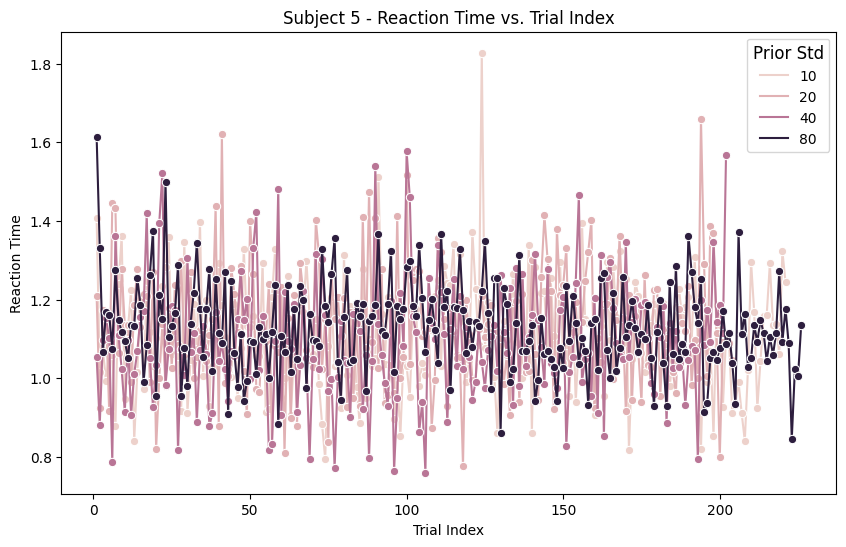

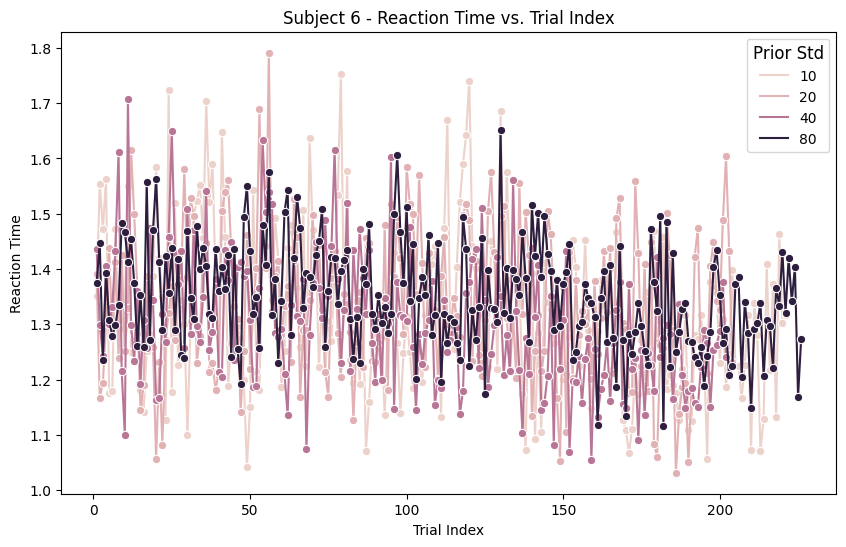

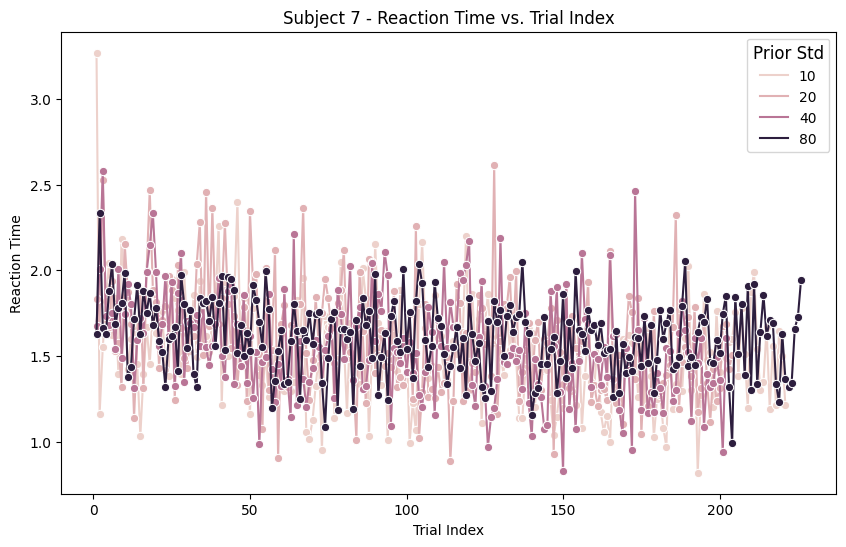

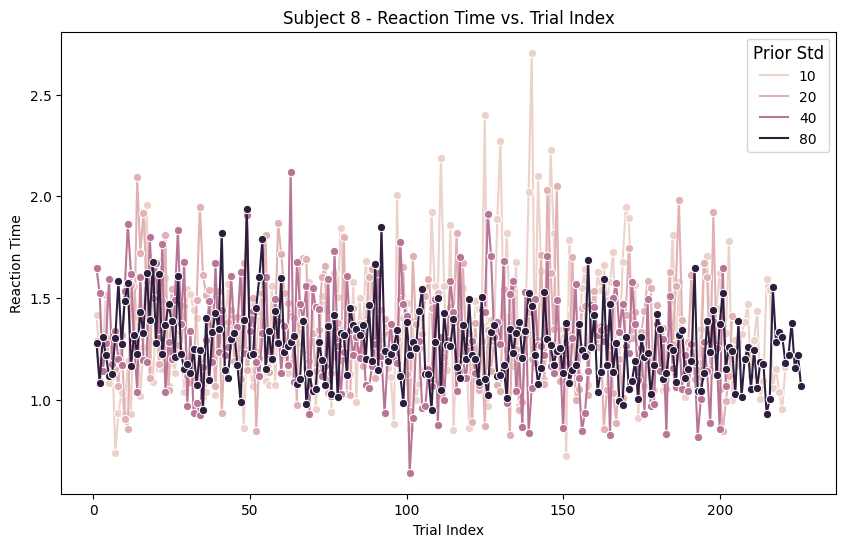

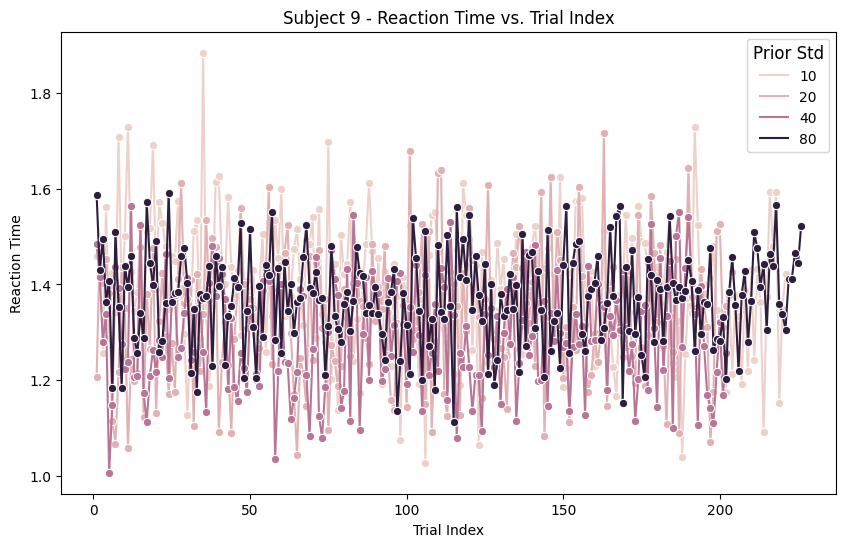

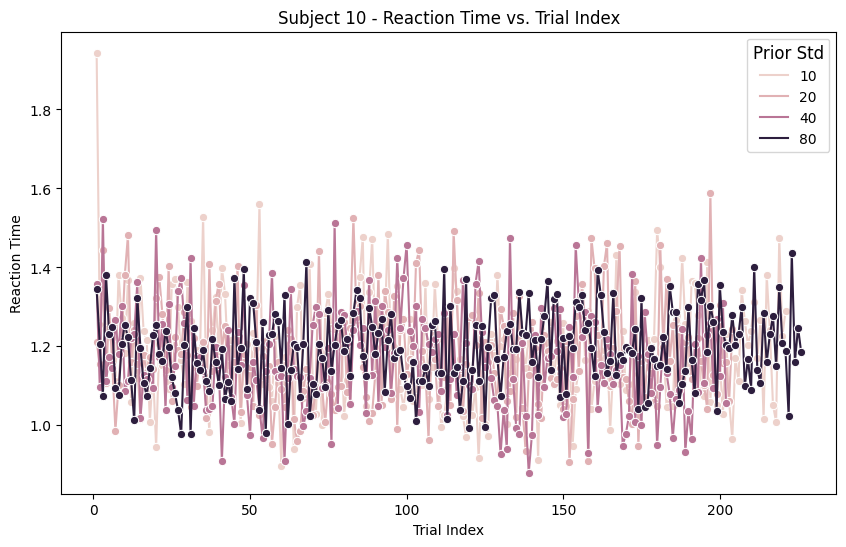

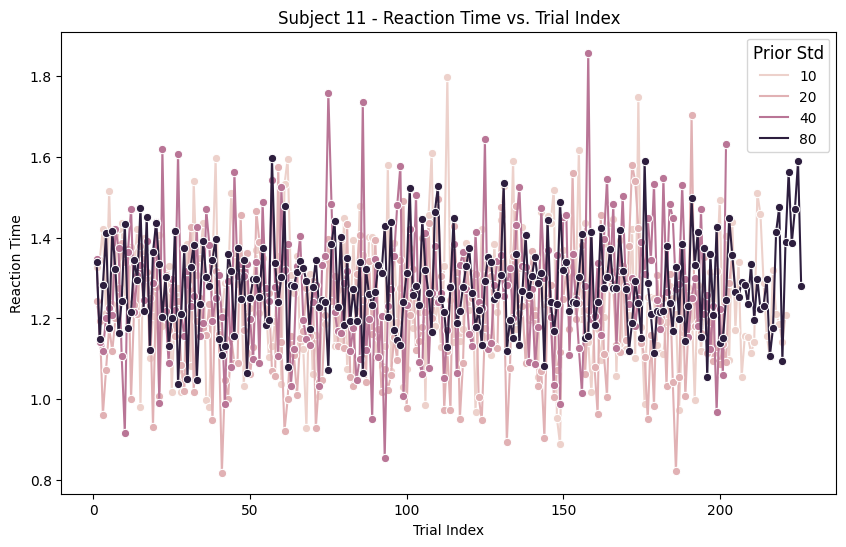

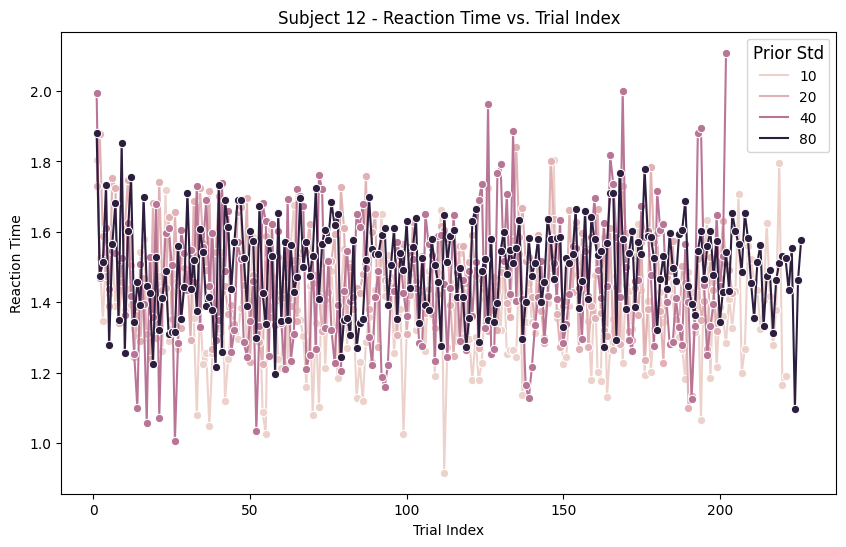

In [ ]:
#Filter the trials N.1: Using averaged_reaction_time_df, plot out reaction time by subjects, grouped by different prior_std
averaged_reaction_time_df=get_averaged_reaction_time_df(df)
plot_reaction_time_by_subjects(averaged_reaction_time_df)

In [ ]:
#Filter the trials N.2: Using averaged_reaction_time_df, plot out reaction time by prior_std, grouped by different subject
#Note: Valid subject_id=[1,3,5,6,7,8,9,10,11,12], Change subject_id_list to show different subjects in plots
subject_id_list=[1,3,5,6,7]

averaged_reaction_time_df=get_averaged_reaction_time_df(df)
plot_reaction_time_by_prior_std(averaged_reaction_time_df, subject_id_list)

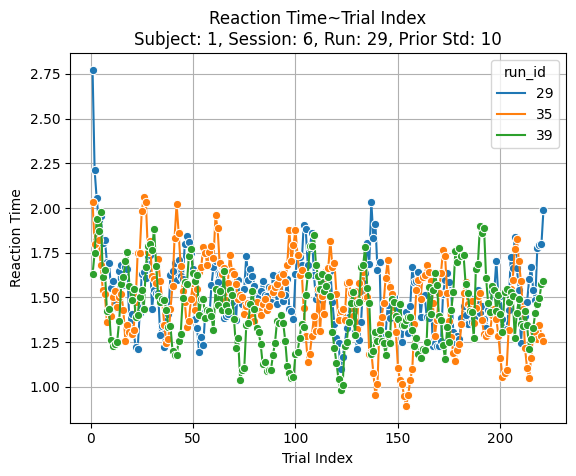

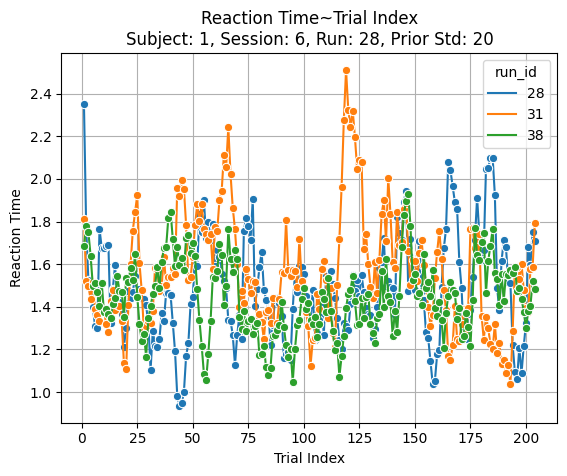

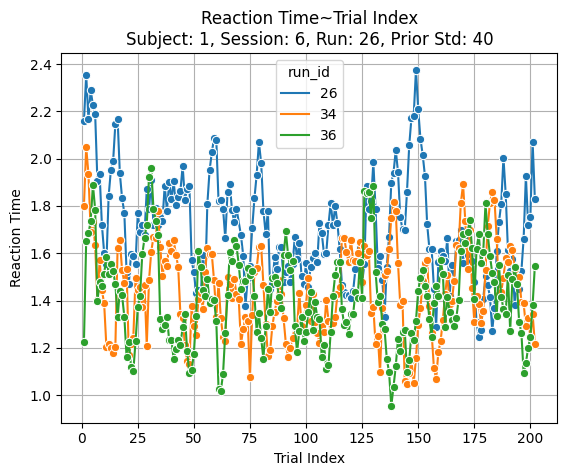

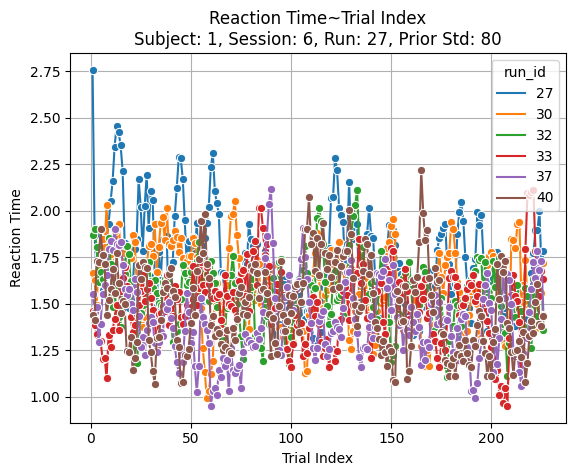

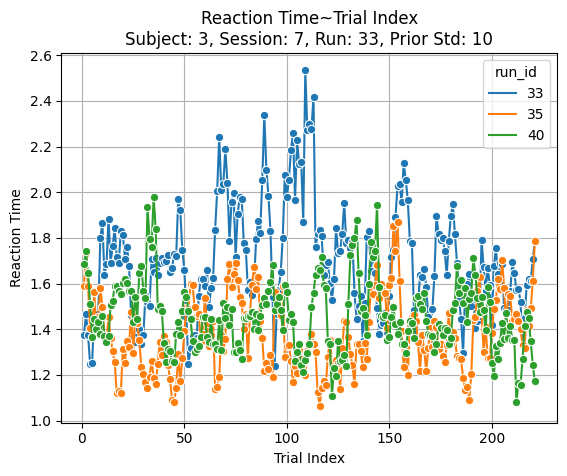

...

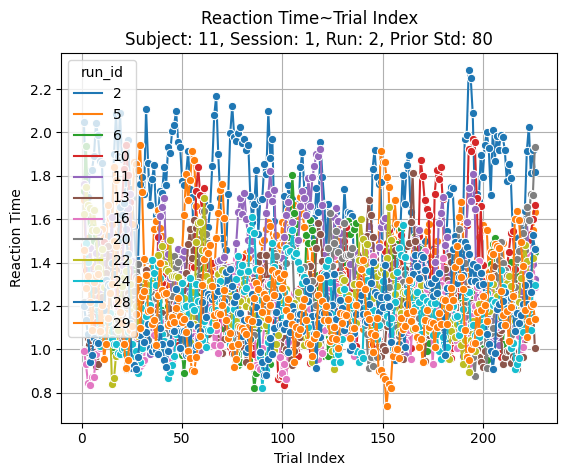

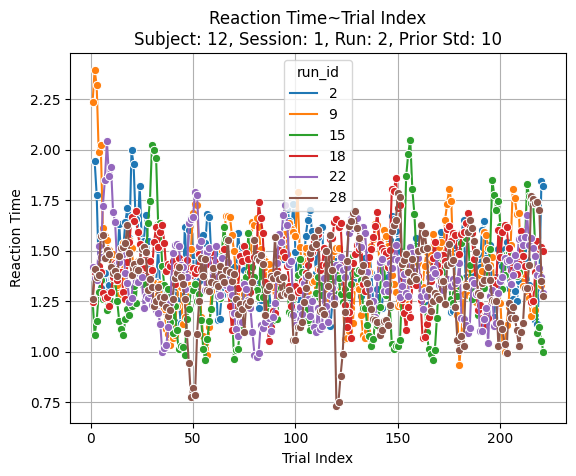

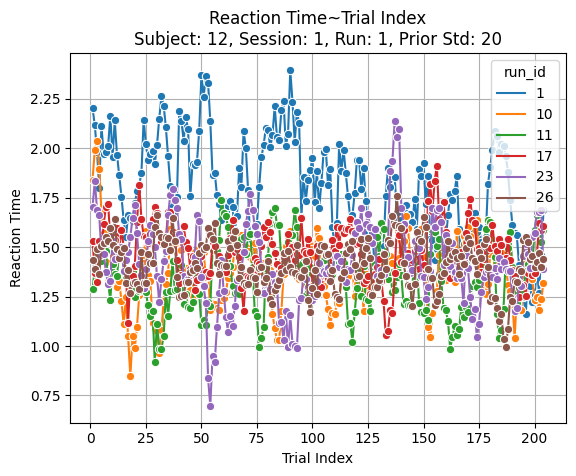

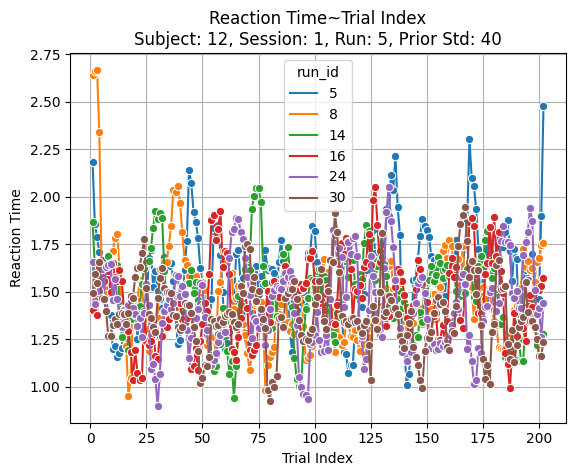

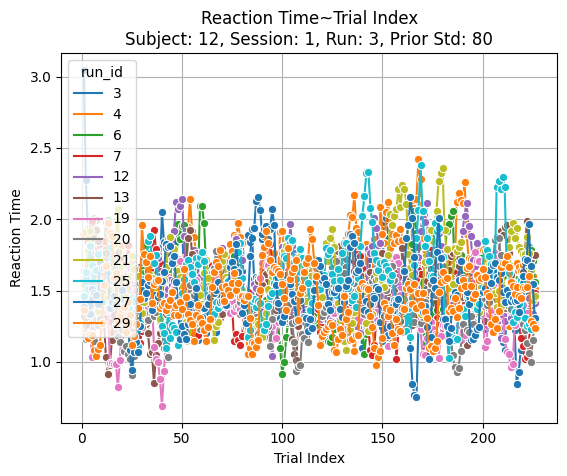

In [ ]:
#Filter the trials N.1: One plot for every subject, all the runs and sessions in one plot, grouped by prior_std
#Note: Prior_std changes at different runs, but sometimes there are multiple runs with same prior_std, different runs are in different colors
for subject in subject_id:
    prior_std_dict = {10: [], 20: [], 40: [], 80: []}
    df_filtered = df[(df["subject_id"] == subject)]

    if not df_filtered.empty:
        nonnans_df = delete_nan_reaction_time(df_filtered)

        # Group the non-NaN rows by 'prior_std'
        group_by_prior_std = nonnans_df.groupby('prior_std')

        for prior_std, df_group_by_prior_std in group_by_prior_std:
            prior_std_dict[prior_std].extend(df_group_by_prior_std['reaction_time'])
            #df_group_by_prior_std contains all values with same prior_std for each subject

            plot_reaction_time(df_group_by_prior_std)

    #print(f"Subject is {subject}")
    #print(f"Prior_std_dict is {prior_std_dict}")

In [ ]:
# Filter the trials N.1: One plot for every subject, all the runs and sessions in one plot, grouped by prior_std
# Note: Prior_std changes at different runs, but sometimes there are multiple runs with the same prior_std, different runs are in different colors

prior_std_list = [10, 20, 40, 80]

#Create empty DataFrame to store averaged_reaction_time for all subjects and prior_std
columns = ['subject_id', 'trial_index'] + prior_std_list
averaged_reaction_time_df = pd.DataFrame(columns=columns)

#Determine the maximum trial index across all subjects
#To ensure prior_std_matrix corresponds to the same trial index, even if some trials are missing
max_trial_index = df['trial_index'].max()

for subject in subject_id:
    df_filtered = df[(df["subject_id"] == subject)]

    if not df_filtered.empty:
        #Filter dataset with only valid reaction time
        nonnans_df = delete_nan_reaction_time(df_filtered)

        #Group rows by prior_std, session_id, and run_id
        group_by_prior_session_run = nonnans_df.groupby(['prior_std', 'session_id', 'run_id'])

        #Create a matrix to store reaction time values for each prior_std (row: trial index, column: prior_std)
        prior_std_matrix = np.empty((max_trial_index, len(prior_std_list)))
        prior_std_matrix[:] = np.nan # Preset all values to NaN

        #Loop over each combination of 'prior_std', 'session_id', and 'run_id'
        for (prior_std, session_id, run_id), df_group in group_by_prior_session_run:
            trial_index = df_group['trial_index']
            reaction_time = df_group['reaction_time']

            #Find the index of this prior_std in the prior_std_list
            prior_std_index = prior_std_list.index(prior_std)

            #Store the reaction time data in the corresponding column of the matrix
            prior_std_matrix[trial_index - 1, prior_std_index] = reaction_time

            '''All data for one subject
            Example output: prior_std_matrix = [
                      prior_std[0]        [100 (trial_index[0]), 110 (trial_index[1]), 120 (trial_index[2]), np.nan (trial_index[3])],
                      prior_std[1]        [95, 105, 125, 135],
                      prior_std[2]        [102, 108, 118, 128],
                      prior_std[3]        ...]'''

        # Compute the average along the rows (across each trial) to get the averaged line for each prior_std
        averaged_reaction_time = np.nanmean(prior_std_matrix, axis=1)
        #Example output: averaged_reaction_time = [110.0, 115.0, 114.0, ...]

        #Inside the subject_id loop: add each subject's data to the DataFrame
        subject_data = pd.DataFrame({
            'subject_id': [subject] * len(trial_index),  # Repeat subject_id to match trial_index length
            'trial_index': trial_index,
            **{prior_std: averaged_reaction_time for prior_std, averaged_reaction_time in zip(prior_std_list, averaged_reaction_time)}
        })
        averaged_reaction_time_df = averaged_reaction_time_df.append(subject_data, ignore_index=True)

'''Example output averaged_reaction_time_df:
            subject_id  trial_index       10         20         40         80
    0           1               1               110.0     115.0     114.0     120.0
    1           1               2               115.0     116.0     119.0     122.0
    2           1               3               112.0     114.0     113.0     118.0
    3           2               1               108.0     113.0     112.0     118.0
    4           2               2               112.0     116.0     115.0     121.0
    5           2               3               116.0     118.0     119.0     125.0
...         ...         ...    ...       ...       ...       ...
        '''

<ipython-input-32-98f0ab606dec>:56: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  averaged_reaction_time_df = averaged_reaction_time_df.append(subject_data, ignore_index=True)
<ipython-input-32-98f0ab606dec>:56: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  averaged_reaction_time_df = averaged_reaction_time_df.append(subject_data, ignore_index=True)
<ipython-input-32-98f0ab606dec>:56: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  averaged_reaction_time_df = averaged_reaction_time_df.append(subject_data, ignore_index=True)
<ipython-input-32-98f0ab606dec>:56: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  averaged_reaction_time_df = averag

'Example output averaged_reaction_time_df:\n            subject_id  trial_index       10         20         40         80\n    0           1               1               110.0     115.0     114.0     120.0\n    1           1               2               115.0     116.0     119.0     122.0\n    2           1               3               112.0     114.0     113.0     118.0\n    3           2               1               108.0     113.0     112.0     118.0\n    4           2               2               112.0     116.0     115.0     121.0\n    5           2               3               116.0     118.0     119.0     125.0\n...         ...         ...    ...       ...       ...       ...\n        '

In [ ]:
#Filter the trials N.2: One plot for each session, all the runs in one plot, and their linear regression
#Note: prior_std is not considered in this plot (different runs in one plot have different prior_std)
for subject in subject_id:
    for session in session_id:
        #for run in run_id:
            df_filtered = df[(df["subject_id"] == subject) & (df["session_id"] == session)]
            #print(f"current subject is {subject}")
            #print(f"current session is {session}")
            #print(f"current run is {run}")
            #print(df_filtered)

            subject_estimate_deg=calc_subject_estimate_deg(df_filtered)
            estimate_error=calc_estimate_error(df_filtered, subject_estimate_deg)
            circular_distance=calc_circular_distance(df_filtered)

            if not df_filtered.empty:
                #plot_error_time_course(df_filtered, estimate_error, circular_distance)

                #print(f"Estimate error for Subject ID: {subject}, Session ID: {session}, Run ID: {run} is {estimate_error}")
                #print(f"Number of estimate error values is {len(estimate_error)}")

                plot_reaction_time(df_filtered)
                get_linear_regression_for_reaction_time(df_filtered)

                #get_linear_regression(df_filtered, subject_estimate_deg)
            else:
                print(f"No data found for Subject ID: {subject}, Session ID: {session}")
                #Note: Some of the sessions have no data

TypeError: ignored

In [ ]:
#Filter the trials N.3: One plot for every run, and their linear regression
for subject in subject_id:
    for session in session_id:
        for run in run_id:
            df_filtered = df[(df["subject_id"] == subject) & (df["session_id"] == session) & (df["run_id"]==run)]
            #print(f"current subject is {subject}")
            #print(f"current session is {session}")
            #print(f"current run is {run}")
            #print(df_filtered)

            subject_estimate_deg=calc_subject_estimate_deg(df_filtered)
            estimate_error=calc_estimate_error(df_filtered, subject_estimate_deg)
            circular_distance=calc_circular_distance(df_filtered)

            if not df_filtered.empty:
                #plot_error_time_course(df_filtered, estimate_error, circular_distance)

                #print(f"Estimate error for Subject ID: {subject}, Session ID: {session}, Run ID: {run} is {estimate_error}")
                #print(f"Number of estimate error values is {len(estimate_error)}")

                plot_reaction_time(df_filtered)
                get_linear_regression_for_reaction_time(df_filtered)

                #get_linear_regression(df_filtered, subject_estimate_deg)
            else:
                print(f"No data found for Subject ID: {subject}, Session ID: {session}, Run ID: {run}")
                #Note: Some of the sessions have no data